In [92]:
import numpy as np
import matplotlib.pyplot as plt
import sys

from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap

plt.rcParams.update({'font.size': 12})

In [71]:
beta = 1.
beta_s = 5*beta
beta_r = 4*beta
dt = 0.0001
N_0 = 250

ts = np.arange(0, 50, dt, dtype=float)

x_0 = np.zeros(N_0 + 500, dtype=float) # Začetna verjetnost
x_0[N_0] = 1.

xs = np.zeros((len(ts), N_0+500), dtype=float)
xs[0] = x_0

updiag = np.array([i*beta_s*dt for i in range(1, N_0+500)])
diag = np.array([1-i*(beta_r+beta_s)*dt for i in range(N_0+500)])
lowdiag = np.array([i*beta_r*dt for i in range(0, N_0+500-1)])

M = np.diag(diag) + np.diag(updiag, 1) + np.diag(lowdiag, -1)

# print(np.sum(M, axis=0))

for i in range(len(ts)-1):
    print(i/(len(ts)-1))
    xs[i+1] = np.dot(M, xs[i])

0.0
2.000004000008e-06
4.000008000016e-06
6.000012000024e-06
8.000016000032e-06
1.000002000004e-05
1.2000024000048e-05
1.4000028000056e-05
1.6000032000064e-05
1.8000036000072e-05
2.000004000008e-05
2.2000044000088e-05
2.4000048000096e-05
2.6000052000104e-05
2.8000056000112e-05
3.000006000012e-05
3.2000064000128e-05
3.4000068000136e-05
3.6000072000144e-05
3.8000076000152e-05
4.000008000016e-05
4.2000084000168e-05
4.4000088000176e-05
4.6000092000184e-05
4.8000096000192e-05
5.00001000002e-05
5.2000104000208e-05
5.4000108000216e-05
5.6000112000224e-05
5.8000116000232e-05
6.000012000024e-05
6.2000124000248e-05
6.4000128000256e-05
6.6000132000264e-05
6.8000136000272e-05
7.000014000028e-05
7.2000144000288e-05
7.4000148000296e-05
7.6000152000304e-05
7.8000156000312e-05
8.000016000032e-05
8.2000164000328e-05
8.4000168000336e-05
8.6000172000344e-05
8.8000176000352e-05
9.000018000036e-05
9.2000184000368e-05
9.4000188000376e-05
9.6000192000384e-05
9.8000196000392e-05
0.0001000002000004
0.000102000

In [118]:
print(np.sum(states*xs, axis=1))

[2.50000000e+02 2.49975000e+02 2.49950003e+02 ... 4.81127743e-20
 4.81079630e-20 4.81031522e-20]


(10000, 750)


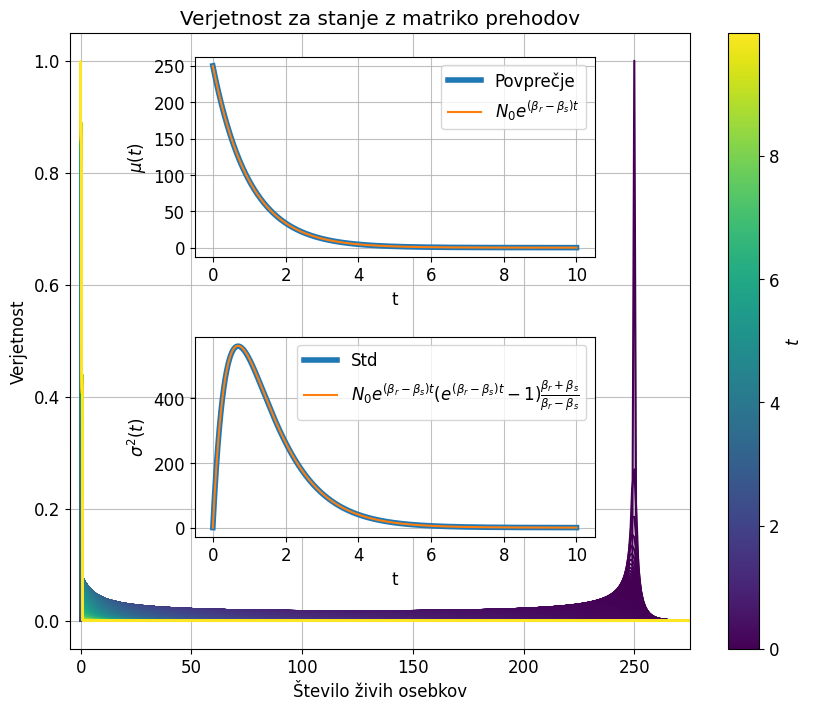

In [137]:
states = np.arange(0, 750, 1)
ts_filtered = ts[::10]
xs_filtered = xs[::10]
xs_filtered = xs_filtered[:10000]
ts_filtered = ts_filtered[:10000]

norm = Normalize(vmin=min(ts_filtered), vmax=max(ts_filtered))
cmap = get_cmap('viridis')

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_title('Verjetnost za stanje z matriko prehodov')
ax.set_ylabel('Verjetnost')
ax.set_xlabel('Število živih osebkov')
ax.grid(alpha=0.8)
ax.set_xlim((-5, 275))

for i, x in enumerate(xs_filtered):
    color = cmap(norm(ts_filtered[i]))
    ax.plot(states, x, color=color)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar1 = plt.colorbar(sm, label=r'$t$', ax=[ax])

ax_inset = fig.add_axes([0.25, 0.60, 0.40, 0.25])
ax_inset.set_xlabel(r't')
ax_inset.set_ylabel(r'$\mu (t)$')
ax_inset.grid(alpha=0.8)
ax_inset.plot(ts[:100000], np.sum(states*xs, axis=1)[:100000], linewidth=4, label='Povprečje')
ax_inset.plot(ts[:100000], N_0*np.exp((beta_r-beta_s)*ts[:100000]), label=r'$N_0 e^{(\beta_r - \beta_s)t}$')
ax_inset.legend()

ax_inset = fig.add_axes([0.25, 0.25, 0.40, 0.25])
ax_inset.set_xlabel(r't')
ax_inset.set_ylabel(r'$\sigma^2 (t)$')
ax_inset.grid(alpha=0.8)
ax_inset.plot(ts[:100000], np.sum(states**2*xs, axis=1)[:100000] - (np.sum(states*xs, axis=1)**2)[:100000], linewidth=4, label='Std')
ax_inset.plot(ts[:100000], 250*np.exp((beta_r-beta_s)*ts[:100000])*(np.exp((beta_r-beta_s)*ts[:100000])-1) * (beta_r+beta_s)/(beta_r-beta_s),
              label=r'$N_0 e^{(\beta_r - \beta_s)t} \left(e^{(\beta_r - \beta_s)t}-1\right) \frac{\beta_r + \beta_s}{\beta_r - \beta_s}$')
ax_inset.legend()

print(np.shape(xs_filtered))